In [53]:
pip install pandas matplotlib seaborn keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.7 MB/s eta 0:00:00


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls drive/MyDrive

 BACKUPS	   'Hogwarts Legacy trophy collectibles.csv'  'UNIVERSITY OF NORTHAMPTON'
'Colab Notebooks'   Overtime.gdoc			      'Untitled document.gdoc'
 data.zip	    Personal
'Google Foto'	    Ref.gdoc


In [3]:
!unzip drive/MyDrive/data.zip


Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
  inflating: data/train/5499.jpg     
  inflating: data/train/55.jpg       
  inflating: data/train/550.jpg      
  inflating: data/train/5500.jpg     
  inflating: data/train/5501.jpg     
  inflating: data/train/5502.jpg     
  inflating: data/train/5503.jpg     
  inflating: data/train/5504.jpg     
  inflating: data/train/5505.jpg     
  inflating: data/train/5506.jpg     
  inflating: data/train/5507.jpg     
  inflating: data/train/5508.jpg     
  inflating: data/train/5509.jpg     
  inflating: data/train/551.jpg      
  inflating: data/train/5510.jpg     
  inflating: data/train/5511.jpg     
  inflating: data/train/5512.jpg     
  inflating: data/train/5513.jpg     
  inflating: data/train/5514.jpg     
  inflating: data/train/5515.jpg     
  inflating: data/train/5516.jpg     
  inflating: data/train/5517.jpg     
  inflating: data/train/5518.jpg     
  inflating: data/train/5519.jpg     
  inflating: data/

In [3]:
import tensorflow as tf
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

RuntimeError: Physical devices cannot be modified after being initialized

In [4]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

**Loading CSV**

In [5]:
import pandas as pd

# Load the CSV files, indicating no header row is present
anno_train = pd.read_csv('anno_train.csv', header=None)
anno_test = pd.read_csv('anno_test.csv', header=None)
names = pd.read_csv('names.csv', header=None)

# Display the first few rows of each dataframe to verify
print("Training Annotations:\n", anno_train.head())
print("Testing Annotations:\n", anno_test.head())
print("Class Names:\n", names.head())

Training Annotations:
            0    1    2     3     4    5
0  00001.jpg   39  116   569   375   14
1  00002.jpg   36  116   868   587    3
2  00003.jpg   85  109   601   381   91
3  00004.jpg  621  393  1484  1096  134
4  00005.jpg   14   36   133    99  106
Testing Annotations:
            0    1    2    3    4    5
0  00001.jpg   30   52  246  147  181
1  00002.jpg  100   19  576  203  103
2  00003.jpg   51  105  968  659  145
3  00004.jpg   67   84  581  407  187
4  00005.jpg  140  151  593  339  185
Class Names:
                             0
0  AM General Hummer SUV 2000
1         Acura RL Sedan 2012
2         Acura TL Sedan 2012
3        Acura TL Type-S 2008
4        Acura TSX Sedan 2012


**Renaming images from train and test folders sequentially**


In [6]:
import os

def rename_images(directory, start_index):
    files = os.listdir(directory)
    files.sort()  # Make sure the files are sorted numerically
    for i, filename in enumerate(files):
        new_filename = f"{start_index + i}.jpg"
        new_filepath = os.path.join(directory, new_filename)

        # Check if the new filename already exists
        if os.path.exists(new_filepath):
            continue

        # Proceed with renaming if the file does not exist
        os.rename(
            os.path.join(directory, filename),
            new_filepath
        )
        print(f"Renamed {filename} to {new_filename}")

# Paths to your train and test directories
train_directory = 'data/train'
test_directory = 'data/test'

# Rename images in the train directory starting from 1
rename_images(train_directory, 1)

# Rename images in the test directory starting from the next index after train
# Assuming 8144 images in the train set, start index for test is 8145
rename_images(test_directory, 8145)


**Adjusting CSV files to reflect the changes to the filenames**

In [7]:
import pandas as pd

def update_csv_filenames(csv_path, output_path, start_index):
    df = pd.read_csv(csv_path, header=None)
    df.columns = ['filename', 'x1', 'y1', 'x2', 'y2', 'label']
    df['filename'] = [(start_index + i) for i in range(len(df))]
    df['filename'] = df['filename'].astype(str) + '.jpg'
    df.to_csv(output_path, index=False, header=False)

# Update train CSV
update_csv_filenames('anno_train.csv', 'updated_anno_train.csv', 1)

# Update test CSV, starting index as per the last training index
update_csv_filenames('anno_test.csv', 'updated_anno_test.csv', 8145)


**Merging Images and CSV Files**

In [8]:
import shutil

# Concatenate the updated CSV files
anno_train_updated = pd.read_csv('updated_anno_train.csv', header=None)
anno_test_updated = pd.read_csv('updated_anno_test.csv', header=None)

full_data = pd.concat([anno_train_updated, anno_test_updated])
full_data.to_csv('full_data.csv', index=False, header=False)

def merge_folders(source, target):
    files = os.listdir(source)
    for file in files:
        shutil.move(os.path.join(source, file), os.path.join(target, file))

# Merge test images into train images directory
merge_folders('data/test', 'data/train')  # Now 'data/train' contains all images

In [9]:
full_data.head()

,0,1,2,3,4,5
0,1.jpg,39,116,569,375,14
1,2.jpg,36,116,868,587,3
2,3.jpg,85,109,601,381,91
3,4.jpg,621,393,1484,1096,134
4,5.jpg,14,36,133,99,106


**Add columns and parse vehicle description string**

In [10]:
full_data.columns = ['filename', 'x1', 'y1', 'x2', 'y2', 'label']

def parse_car_name(car_name):
    parts = car_name.split()
    year = parts[-1]  # Last part is the year
    type = parts[-2]  # Second to last part is the type
    brand = parts[0]  # First part is the brand
    model = ' '.join(parts[1:-2])  # Everything else is the model
    return brand, model, type, year

In [11]:
import pandas as pd

# Load the names file
names = pd.read_csv('names.csv', header=None)
names.columns = ['class_name']

# Define the function to add car details
def add_car_details(df, names_df):
    # Adding the car_name from names DataFrame
    df['car_name'] = df['label'].apply(lambda x: names_df.iloc[x-1]['class_name'])
    # Extracting and adding brand, model, type, year
    df[['brand', 'model', 'type', 'year']] = df['car_name'].apply(
        lambda x: pd.Series(parse_car_name(x))
    )
    return df

# Apply the function to pd
full_data = add_car_details(full_data, names)

# Example of what the data looks like now
print("Full Data with Vehicle Details:\n", full_data.head())

Full Data with Vehicle Details:
   filename   x1   y1    x2    y2  label                             car_name  \
0    1.jpg   39  116   569   375     14                  Audi TTS Coupe 2012   
1    2.jpg   36  116   868   587      3                  Acura TL Sedan 2012   
2    3.jpg   85  109   601   381     91           Dodge Dakota Club Cab 2007   
3    4.jpg  621  393  1484  1096    134     Hyundai Sonata Hybrid Sedan 2012   
4    5.jpg   14   36   133    99    106  Ford F-450 Super Duty Crew Cab 2012   

     brand                  model   type  year  
0     Audi                    TTS  Coupe  2012  
1    Acura                     TL  Sedan  2012  
2    Dodge            Dakota Club    Cab  2007  
3  Hyundai          Sonata Hybrid  Sedan  2012  
4     Ford  F-450 Super Duty Crew    Cab  2012  


In [12]:
# Drop the 'car_name' column in place
full_data.drop(columns=['car_name'], inplace=True)

# Save to CSV
full_data.to_csv('final_full_data.csv', index=False)

# Print the first few rows to verify
print(full_data.head())

  filename   x1   y1    x2    y2  label    brand                  model  \
0    1.jpg   39  116   569   375     14     Audi                    TTS   
1    2.jpg   36  116   868   587      3    Acura                     TL   
2    3.jpg   85  109   601   381     91    Dodge            Dakota Club   
3    4.jpg  621  393  1484  1096    134  Hyundai          Sonata Hybrid   
4    5.jpg   14   36   133    99    106     Ford  F-450 Super Duty Crew   

    type  year  
0  Coupe  2012  
1  Sedan  2012  
2    Cab  2007  
3  Sedan  2012  
4    Cab  2012  


In [13]:
import pandas as pd

# Assuming 'full_data' is your DataFrame
full_data = pd.read_csv('final_full_data.csv')

# Print basic info and the first few rows
print(full_data.info())

# Statistical summary of numerical fields
print(full_data.describe())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16185 entries, 0 to 16184
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  16185 non-null  object
 1   x1        16185 non-null  int64 
 2   y1        16185 non-null  int64 
 3   x2        16185 non-null  int64 
 4   y2        16185 non-null  int64 
 5   label     16185 non-null  int64 
 6   brand     16185 non-null  object
 7   model     16185 non-null  object
 8   type      16185 non-null  object
 9   year      16185 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 1.2+ MB
None
                 x1            y1            x2            y2         label  \
count  16185.000000  16185.000000  16185.000000  16185.000000  16185.000000   
mean      64.981650    108.241396    638.817300    416.863948     98.977448   
std       82.264644    106.302820    411.189718    274.212181     56.502610   
min        1.000000      1.000000     72.000000     41.000000   

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_category_counts(df, column, color='deepskyblue', title=None, limit=None):
    if limit:
        top_categories = df[column].value_counts().head(limit).index
        df = df[df[column].isin(top_categories)]

    plt.figure(figsize=(12, 8))
    sns.countplot(x=column, data=df, color=color, order=df[column].value_counts().index)
    plt.title(title or f'Count of Entries by {column}')
    plt.ylabel('Count')
    plt.xlabel(column.capitalize())
    plt.xticks(rotation=45)  # Helps with label readability
    plt.show()


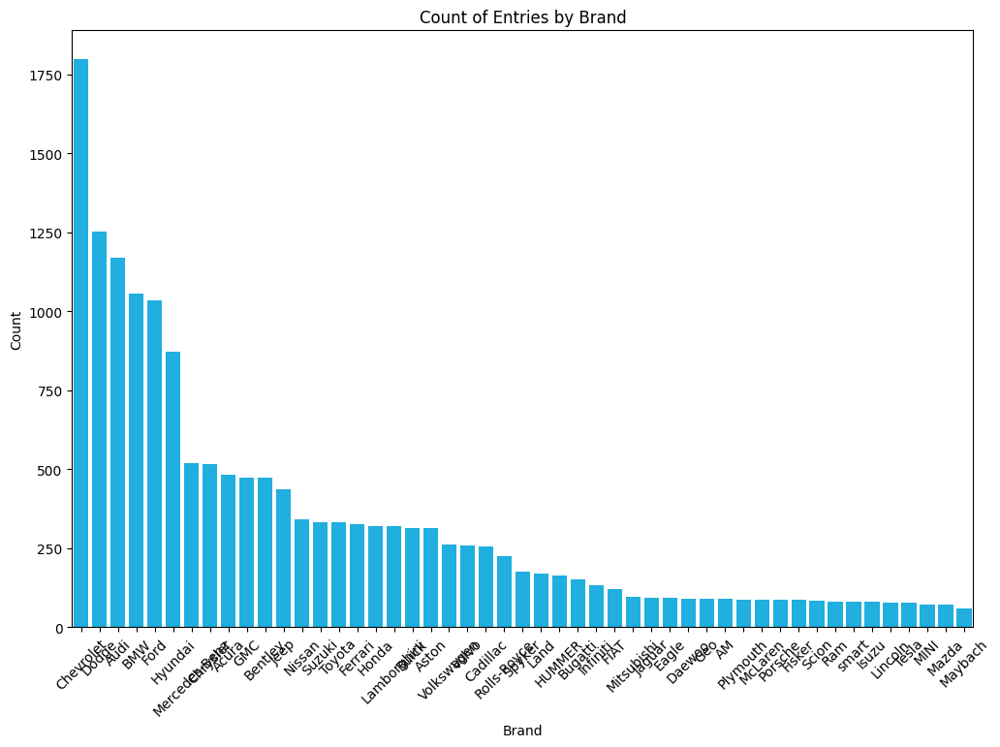

In [15]:
# Visualize counts for brand
plot_category_counts(full_data, 'brand', title='Count of Entries by Brand', color='deepskyblue')

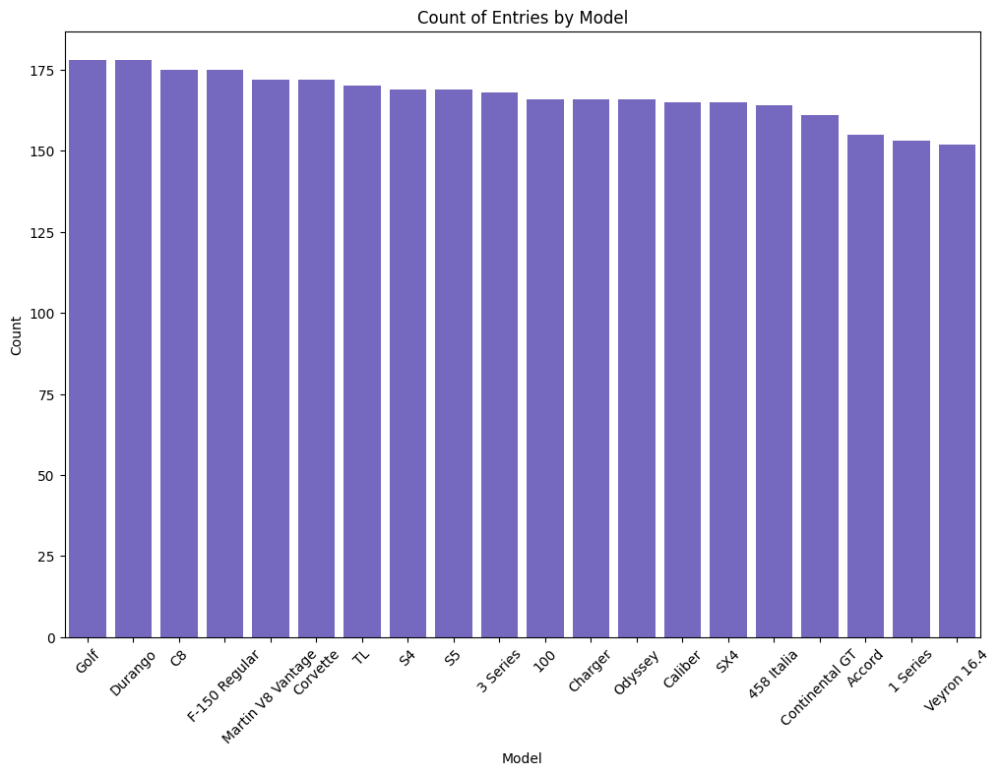

In [16]:
# Visualize counts for model
plot_category_counts(full_data, 'model', title='Count of Entries by Model', color='slateblue', limit=20)

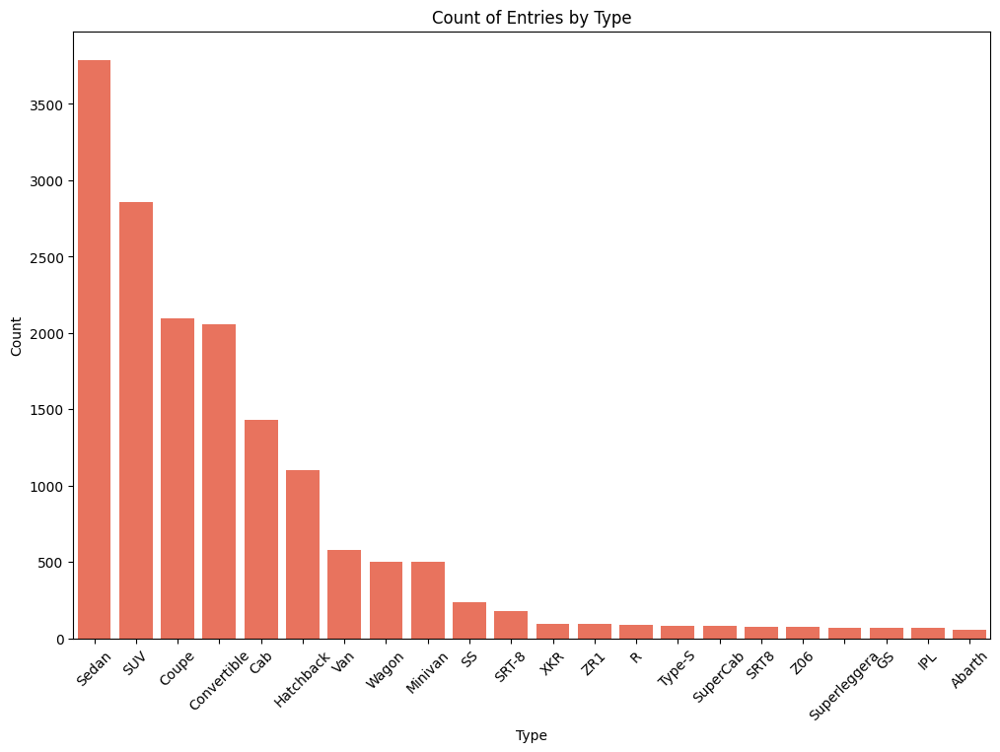

In [17]:
# Visualize counts for type
plot_category_counts(full_data, 'type', title='Count of Entries by Type', color='tomato')

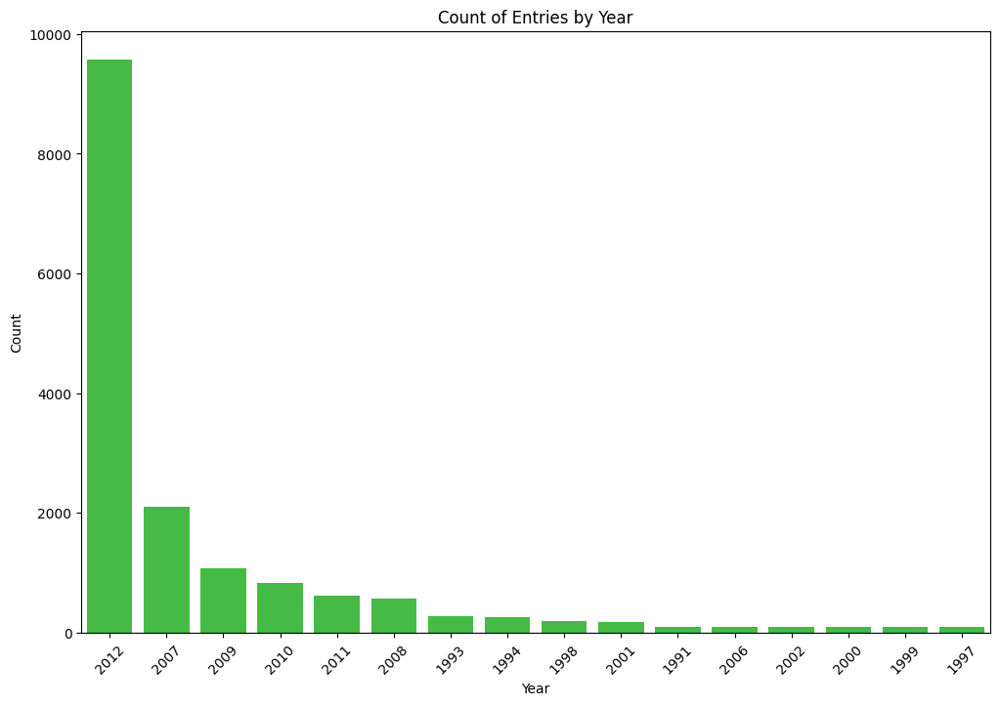

In [18]:
# Visualize counts for year
plot_category_counts(full_data, 'year', title='Count of Entries by Year', color='limegreen')

**Creating separate directories and splitting data**

In [19]:
# Create directories
import os

os.makedirs('data/train_split', exist_ok=True)
os.makedirs('data/val_split', exist_ok=True)
os.makedirs('data/test_split', exist_ok=True)

In [20]:
# Splitting the data into train, test and val sets
from sklearn.model_selection import train_test_split

train_val, test_data = train_test_split(full_data, test_size=0.10, stratify=full_data['label'], random_state=42)
train_data, val_data = train_test_split(train_val, test_size=0.25, stratify=train_val['label'], random_state=42)

print("Train size:", len(train_data))
print("Validation size:", len(val_data))
print("Test size:", len(test_data))

Train size: 10924
Validation size: 3642
Test size: 1619


In [21]:
# Assuming you have a pandas DataFrame for train_data, test_data, and val_data
# and each DataFrame has a column named 'label' for class labels.

print("Total classes in dataset:", full_data['label'].nunique())
print("Unique classes in training data:", train_data['label'].nunique())
print("Unique classes in testing data:", test_data['label'].nunique())
print("Unique classes in validation data:", val_data['label'].nunique())

# Check if all classes are present in each split
all_classes = set(full_data['label'].unique())
train_classes = set(train_data['label'].unique())
test_classes = set(test_data['label'].unique())
val_classes = set(val_data['label'].unique())

print("All classes are present in training data:", all_classes == train_classes)
print("All classes are present in testing data:", all_classes == test_classes)
print("All classes are present in validation data:", all_classes == val_classes)


Total classes in dataset: 196
Unique classes in training data: 196
Unique classes in testing data: 196
Unique classes in validation data: 196
All classes are present in training data: True
All classes are present in testing data: True
All classes are present in validation data: True


In [22]:
import shutil

def move_images(data, source_dir, target_dir):
    for _, row in data.iterrows():
        src_path = os.path.join(source_dir, row['filename'])
        dest_path = os.path.join(target_dir, row['filename'])
        if os.path.exists(src_path):
            shutil.move(src_path, dest_path)
        else:
            print(f"File not found: {src_path}")

# Move training images
move_images(train_data, 'data/train', 'data/train_split')

# Move validation images
move_images(val_data, 'data/train', 'data/val_split')

# Move testing images
move_images(test_data, 'data/train', 'data/test_split')


Datele de ieșire de afișat au fost trunchiate la ultimele 5000 linii.
File not found: data/train/8891.jpg
File not found: data/train/11871.jpg
File not found: data/train/9972.jpg
File not found: data/train/9260.jpg
File not found: data/train/10904.jpg
File not found: data/train/4128.jpg
File not found: data/train/15781.jpg
File not found: data/train/1770.jpg
File not found: data/train/12624.jpg
File not found: data/train/7415.jpg
File not found: data/train/10988.jpg
File not found: data/train/3064.jpg
File not found: data/train/15651.jpg
File not found: data/train/13458.jpg
File not found: data/train/14465.jpg
File not found: data/train/7788.jpg
File not found: data/train/5406.jpg
File not found: data/train/10197.jpg
File not found: data/train/4292.jpg
File not found: data/train/810.jpg
File not found: data/train/9669.jpg
File not found: data/train/8394.jpg
File not found: data/train/8589.jpg
File not found: data/train/2662.jpg
File not found: data/train/7233.jpg
File not found: data/t

**Loading and processing images**

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def load_and_process_images(data, img_dir):
    images = []
    labels = []
    for _, row in data.iterrows():
        img_path = f"{img_dir}/{row['filename']}"
        img = cv2.imread(img_path)
        if img is not None:
            x1, y1, x2, y2 = int(row['x1']), int(row['y1']), int(row['x2']), int(row['y2'])
            cropped_img = img[y1:y2, x1:x2]
            resized_img = cv2.resize(cropped_img, (224, 224))
            normalized_img = resized_img.astype('float32') / 255.0  # Ensure the dtype is float32
            images.append(normalized_img)
            labels.append(row['label'])
    return np.array(images), np.array(labels)

In [24]:
train_images, train_labels = load_and_process_images(train_data, 'data/train_split')
val_images, val_labels = load_and_process_images(val_data, 'data/val_split')
test_images, test_labels = load_and_process_images(test_data, 'data/test_split')

Train Image Pixel Values:


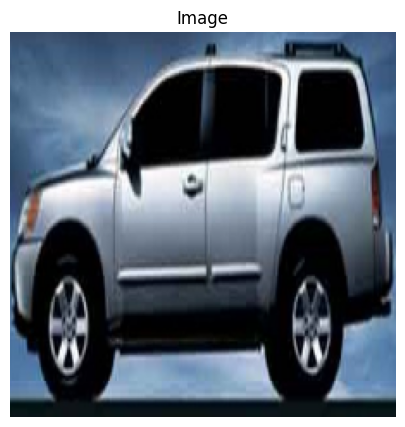

Pixel values (scaled between 0 and 1):
[[[0.4117647  0.29803923 0.21568628]
  [0.4117647  0.29803923 0.21568628]
  [0.4117647  0.29803923 0.21568628]
  ...
  [0.4862745  0.3254902  0.22745098]
  [0.47843137 0.32156864 0.22352941]
  [0.46666667 0.32156864 0.21960784]]

 [[0.41568628 0.3019608  0.21960784]
  [0.41568628 0.3019608  0.21960784]
  [0.41568628 0.3019608  0.21960784]
  ...
  [0.49019608 0.32941177 0.23137255]
  [0.4862745  0.3254902  0.22745098]
  [0.47843137 0.3254902  0.22745098]]

 [[0.41960785 0.30588236 0.22352941]
  [0.41960785 0.30588236 0.22352941]
  [0.41960785 0.30588236 0.22352941]
  ...
  [0.49803922 0.3372549  0.23921569]
  [0.4862745  0.3254902  0.23137255]
  [0.48235294 0.32941177 0.23137255]]

 ...

 [[0.07843138 0.07843138 0.02745098]
  [0.09411765 0.09019608 0.03529412]
  [0.09803922 0.09019608 0.03921569]
  ...
  [0.09411765 0.09019608 0.03529412]
  [0.09803922 0.08627451 0.03137255]
  [0.10588235 0.09411765 0.04705882]]

 [[0.08627451 0.08627451 0.03529412

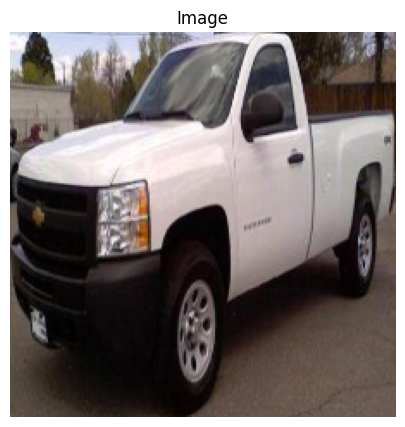

Pixel values (scaled between 0 and 1):
[[[0.8784314  0.8235294  0.7764706 ]
  [0.90588236 0.85490197 0.8039216 ]
  [0.8901961  0.8352941  0.7882353 ]
  ...
  [0.60784316 0.5372549  0.5647059 ]
  [0.5882353  0.5294118  0.5568628 ]
  [0.45490196 0.40392157 0.43137255]]

 [[0.93333334 0.8901961  0.85882354]
  [0.9764706  0.9372549  0.8980392 ]
  [0.9411765  0.9019608  0.8666667 ]
  ...
  [0.61960787 0.54901963 0.58431375]
  [0.5764706  0.52156866 0.5529412 ]
  [0.4392157  0.39215687 0.42352942]]

 [[1.         0.9764706  0.9529412 ]
  [1.         1.         0.9764706 ]
  [1.         0.9882353  0.9647059 ]
  ...
  [0.53333336 0.4745098  0.5058824 ]
  [0.57254905 0.5176471  0.54901963]
  [0.44705883 0.41960785 0.44705883]]

 ...

 [[0.25882354 0.3019608  0.34901962]
  [0.27450982 0.32156864 0.36862746]
  [0.2509804  0.29803923 0.34509805]
  ...
  [0.3137255  0.34117648 0.41568628]
  [0.3137255  0.34117648 0.41568628]
  [0.31764707 0.34509805 0.41960785]]

 [[0.3019608  0.34901962 0.39607844

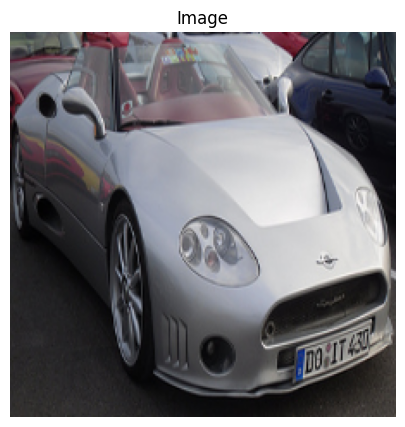

Pixel values (scaled between 0 and 1):
[[[0.3019608  0.3019608  0.3019608 ]
  [0.3019608  0.3019608  0.3019608 ]
  [0.3137255  0.3137255  0.29411766]
  ...
  [0.21960784 0.18431373 0.14509805]
  [0.2627451  0.22745098 0.19215687]
  [0.29411766 0.27058825 0.24705882]]

 [[0.32941177 0.33333334 0.29803923]
  [0.3254902  0.32941177 0.29803923]
  [0.30980393 0.3372549  0.3019608 ]
  ...
  [0.21568628 0.18039216 0.14117648]
  [0.2509804  0.21568628 0.18431373]
  [0.2784314  0.2509804  0.23137255]]

 [[0.3254902  0.35686275 0.3019608 ]
  [0.3254902  0.36078432 0.29803923]
  [0.31764707 0.34509805 0.30588236]
  ...
  [0.21568628 0.18039216 0.14509805]
  [0.23921569 0.20392157 0.16862746]
  [0.26666668 0.23921569 0.21960784]]

 ...

 [[0.19607843 0.20392157 0.20784314]
  [0.19607843 0.2        0.20392157]
  [0.18431373 0.19215687 0.19607843]
  ...
  [0.22745098 0.23529412 0.25490198]
  [0.25882354 0.27450982 0.29411766]
  [0.20784314 0.22745098 0.24705882]]

 [[0.1764706  0.19215687 0.19607843

In [25]:
# Function to display pixel values of a single image
def show_pixel_values(image):
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_BGR2RGB))
    plt.title('Image')
    plt.axis('off')
    plt.show()

    print("Pixel values (scaled between 0 and 1):")
    print(image)

# Display pixel values for a random train, validation, and test image
print("Train Image Pixel Values:")
show_pixel_values(train_images[0])

print("Validation Image Pixel Values:")
show_pixel_values(val_images[0])

print("Test Image Pixel Values:")
show_pixel_values(test_images[0])

**Testing if labels belong to the right images**

Train Images:


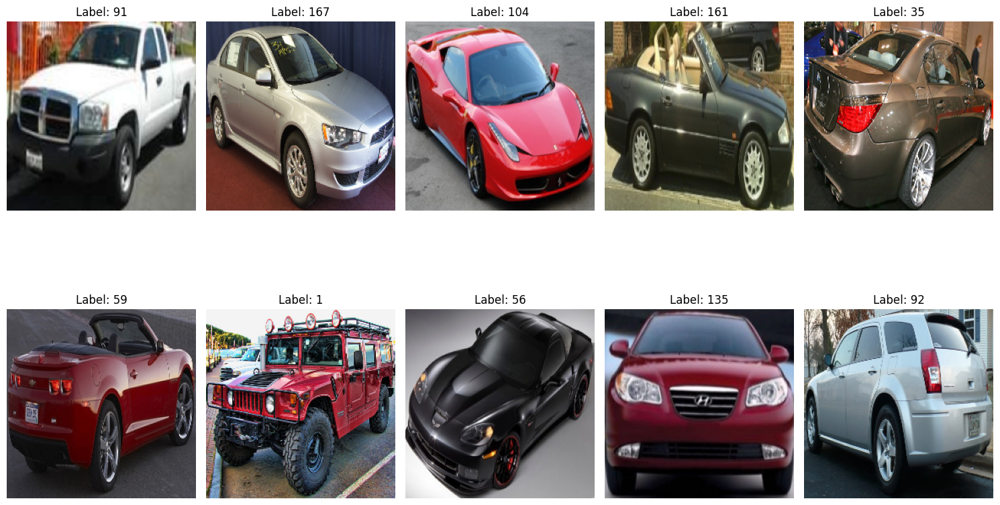

Validation Images:


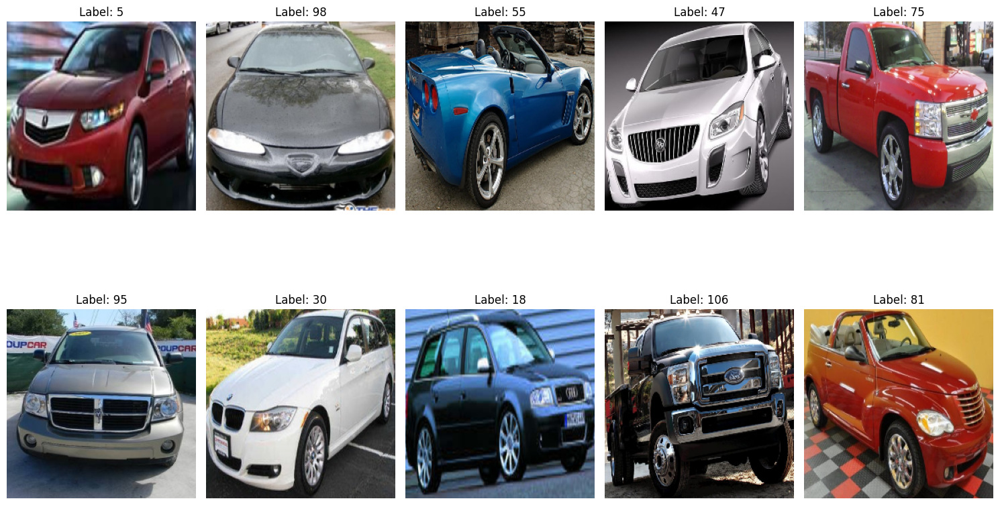

Test Images:


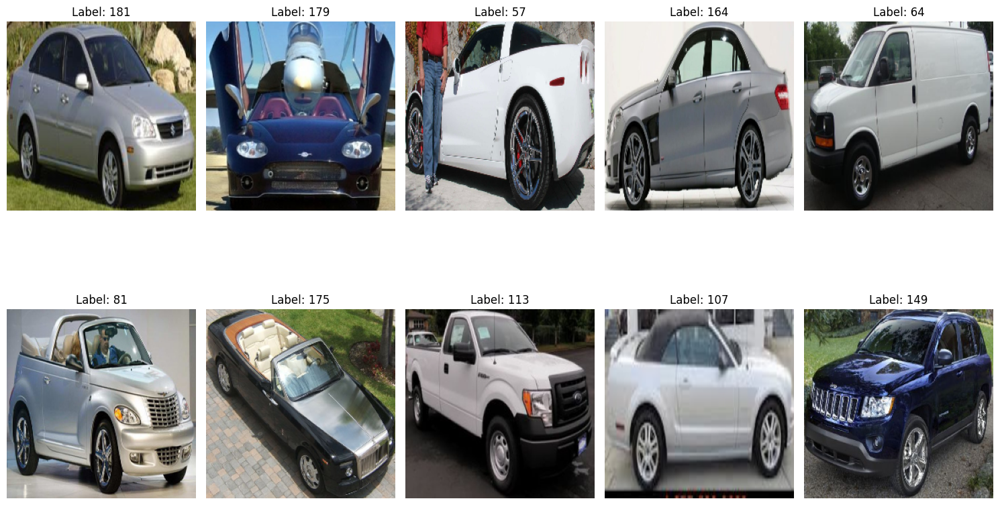

In [26]:
import matplotlib.pyplot as plt
import cv2

def show_images(images, labels, num=10):
    plt.figure(figsize=(15, 10))
    indices = np.random.choice(range(len(images)), num, replace=False)
    for i, index in enumerate(indices):
        ax = plt.subplot(2, 5, i + 1)
        plt.imshow(cv2.cvtColor((images[index] * 255).astype('uint8'), cv2.COLOR_BGR2RGB))
        plt.title(f'Label: {labels[index]}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Show a few images from train, validation, and test sets
print("Train Images:")
show_images(train_images, train_labels, num=10)

print("Validation Images:")
show_images(val_images, val_labels, num=10)

print("Test Images:")
show_images(test_images, test_labels, num=10)


In [27]:
import numpy as np

def check_data_integrity(images, labels):
    # Check for NaNs or Infs in images and labels
    print("NaNs in images:", np.isnan(images).any())
    print("NaNs in labels:", np.isnan(labels).any())
    print("Infs in images:", np.isinf(images).any())
    print("Infs in labels:", np.isinf(labels).any())

    # Check the unique labels to ensure they are within expected range
    unique_labels = np.unique(labels)
    print("Unique labels:", unique_labels)
    return unique_labels

# Check integrity for train, validation, and test sets
print("Train Data Integrity:")
train_unique_labels = check_data_integrity(train_images, train_labels)

print("\nValidation Data Integrity:")
val_unique_labels = check_data_integrity(val_images, val_labels)

print("\nTest Data Integrity:")
test_unique_labels = check_data_integrity(test_images, test_labels)


Train Data Integrity:
NaNs in images: False
NaNs in labels: False
Infs in images: False
Infs in labels: False
Unique labels: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196]

Validation Data Integrity:
NaNs in images: False
NaNs in labels: False
Infs in

In [28]:
def check_label_ranges(labels, num_classes):
    min_label = labels.min()
    max_label = labels.max()
    valid_range = min_label >= 0 and max_label <= num_classes
    print(f"Labels range from {min_label} to {max_label}.")
    print("Labels are within the valid range:" if valid_range else "Labels are out of the valid range!")
    return valid_range

# Define the number of classes
num_classes = 196  # Adjust based on your dataset

# Check label ranges for train, validation, and test sets
print("Train Label Ranges:")
train_labels_valid = check_label_ranges(train_labels, num_classes)

print("\nValidation Label Ranges:")
val_labels_valid = check_label_ranges(val_labels, num_classes)

print("\nTest Label Ranges:")
test_labels_valid = check_label_ranges(test_labels, num_classes)


Train Label Ranges:
Labels range from 1 to 196.
Labels are within the valid range:

Validation Label Ranges:
Labels range from 1 to 196.
Labels are within the valid range:

Test Label Ranges:
Labels range from 1 to 196.
Labels are within the valid range:


In [29]:
from tensorflow.keras.utils import to_categorical

train_labels -= 1
val_labels -= 1
test_labels -= 1
# Convert labels to one-hot encoding
train_labels_one_hot = to_categorical(train_labels, num_classes=196)
val_labels_one_hot = to_categorical(val_labels, num_classes=196)
test_labels_one_hot = to_categorical(test_labels, num_classes=196)

# Print one-hot encoded labels
print("Sample one-hot encoded train labels:")
print(train_labels_one_hot[:5])

print("Sample one-hot encoded validation labels:")
print(val_labels_one_hot[:5])

Sample one-hot encoded train labels:
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

In [30]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create an instance of ImageDataGenerator with desired augmentations
data_gen = ImageDataGenerator(
    rotation_range=20,        # Random rotations between -20 to 20 degrees
    horizontal_flip=True,     # Random horizontal flipping
    shear_range=0.15,

)

In [31]:
# Make sure images are in the correct shape (num_samples, height, width, channels)
train_images = train_images.reshape((-1, 224, 224, 3))

# Choose an appropriate batch size
batch_size = 32

# Prepare the generator and passing images and one-hot-encoded labels
train_generator = data_gen.flow(train_images, train_labels_one_hot, batch_size)

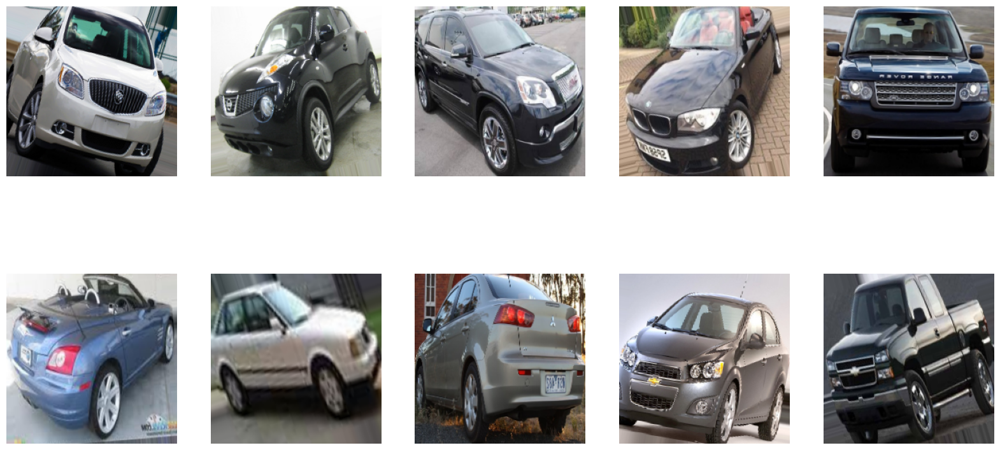

In [32]:
def display_augmented_images(generator, num_images):
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        # Generate a batch of images
        batch = next(generator)
        image = batch[0][0]  # Take the first image from the batch
        ax = plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.show()

# Display 10 augmented images
display_augmented_images(train_generator, 10)

**Basic Convolutional Neural Netowrk Model**

In [33]:
from tensorflow.keras.callbacks import Callback
from sklearn.metrics import precision_score, recall_score, f1_score
import numpy as np

class MetricsCallback(Callback):
    def __init__(self, validation_data):
        super().__init__()
        self.validation_data = validation_data

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        val_predict = np.argmax(self.model.predict(self.validation_data[0]), axis=-1)
        val_targ = np.argmax(self.validation_data[1], axis=-1)

        precision = precision_score(val_targ, val_predict, average='macro')
        recall = recall_score(val_targ, val_predict, average='macro')
        f1 = f1_score(val_targ, val_predict, average='macro')

        logs['val_precision'] = precision
        logs['val_recall'] = recall
        logs['val_f1'] = f1

        print(f" — val_precision: {precision:.4f} — val_recall: {recall:.4f} — val_f1: {f1:.4f}")


In [34]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Conv2D, BatchNormalization, ReLU, MaxPooling2D, Dense, Dropout, Flatten, SpatialDropout2D
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam

# Clear any previous sessions
tf.keras.backend.clear_session()

# Define the basic CNN model
def create_basic_cnn_model(input_shape=(224, 224, 3), num_classes=196):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))

    # Convolutional Layer 2
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))

    # Convolutional Layer 3
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))

    # Fully Connected Layer
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer
    model.add(Dense(num_classes, activation='softmax'))

    return model

# Create the model
cnn_model = create_basic_cnn_model()

# Compile the model
cnn_model.compile(optimizer=Adam(learning_rate=0.001),
                        loss='categorical_crossentropy',
                        metrics=['categorical_accuracy'])

# Print the model summary
print(cnn_model.summary())


NameError: name 'basic_cnn_model' is not defined

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the early stopping callback
class CustomEarlyStopping(EarlyStopping):
    def on_train_end(self, logs=None):
        super().on_train_end(logs)
        if self.stopped_epoch > 0:
            print(f"Early stopping at epoch {self.stopped_epoch + 1}")

# Define the custom early stopping callback
early_stopping = CustomEarlyStopping(
    monitor='val_loss',       # Monitor the validation loss
    patience=5,               # Stop training after 5 epochs with no improvement
    restore_best_weights=True # Restore the best weights after stopping
)

# Define the learning rate scheduler callback
learning_rate_scheduler = ReduceLROnPlateau(
    monitor='val_loss',       # Monitor the validation loss
    factor=0.1,               # Reduce the learning rate by a factor of 0.1
    patience=3,               # Wait for 3 epoch with no improvement before reducing
    min_lr=1e-7,              # Set a minimum learning rate
    verbose=1                 # Print a message when the learning rate is reduced
)

# Custom Metrics Callback
metrics_callback = MetricsCallback()

# Calculate steps per epoch
steps_size = len(train_images) // batch_size

# Add the callbacks to the fit method
history = cnn_model.fit(
    train_generator,
    epochs=20,
    steps_per_epoch=steps_size,
    validation_data=(val_images, val_labels_one_hot),
    callbacks=[early_stopping, learning_rate_scheduler, metrics_callback]  # Add the callbacks here
)

In [ ]:
# Save the entire model to a file in the root directory
cnn_model.save('cnnbasic-1.h5')

# Print a confirmation message
print("Model saved successfully!")

**HyperParameter Tuning**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras_tuner import RandomSearch

def build_model(hp):
    model = Sequential()
    model.add(Conv2D(hp.Int('conv_units', min_value=32, max_value=256, step=32), (3, 3), activation='relu', input_shape=(224, 224, 3)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(hp.Int('conv_units', min_value=32, max_value=256, step=32), (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(hp.Int('dense_units', min_value=128, max_value=512, step=64), activation='relu'))
    model.add(Dropout(hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1)))
    model.add(Dense(196, activation='softmax'))

    model.compile(optimizer=keras.optimizers.Adam(hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')),
                  loss='categorical_crossentropy',
                  metrics=['categorical_accuracy'])

    return model

In [ ]:
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=3,
    executions_per_trial=1,
    directory='my_dir',
    project_name='helloworld'
)

# Display search space summary
tuner.search_space_summary()

# Perform hyperparameter search
tuner.search(train_generator, epochs=5, validation_data=(val_images, val_labels_one_hot))

# Retrieve the best model and hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"The best number of units in the first layer is {best_hps.get('conv_units')}")
print(f"The best learning rate for the optimizer is {best_hps.get('learning_rate')}")

In [ ]:
best_model = tuner.hypermodel.build(best_hps)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# Define the early stopping callback
class CustomEarlyStopping(EarlyStopping):
    def on_train_end(self, logs=None):
        super().on_train_end(logs)
        if self.stopped_epoch > 0:
            print(f"Early stopping at epoch {self.stopped_epoch + 1}")

# Define the custom early stopping callback
early_stopping = CustomEarlyStopping(
    monitor='val_loss',       # Monitor the validation loss
    patience=5,               # Stop training after 5 epochs with no improvement
    restore_best_weights=True # Restore the best weights after stopping
)

# Define the learning rate scheduler callback
learning_rate_scheduler = ReduceLROnPlateau(
    monitor='val_loss',       # Monitor the validation loss
    factor=0.1,               # Reduce the learning rate by a factor of 0.1
    patience=3,               # Wait for 3 epoch with no improvement before reducing
    min_lr=1e-7,              # Set a minimum learning rate
    verbose=1                 # Print a message when the learning rate is reduced
)

# Custom Metrics Callback
metrics_callback = MetricsCallback(validation_data=(val_images, val_labels_one_hot))

# Calculate steps per epoch
steps_size = len(train_images) // batch_size

# Clear any previous sessions
tf.keras.backend.clear_session()

# Train the best model
history = best_model.fit(train_generator, epochs=20, validation_data=(val_images, val_labels_one_hot), callbacks=[early_stopping, learning_rate_scheduler])


**MobileNetV2 Pre-Trained Model**

In [ ]:
from keras.applications import MobileNetV2 as pretrained_model

In [ ]:
# Clearing session
tf.keras.backend.clear_session()

# Unfreezing layers from pre-trained model
n_unfreeze    =  10

def unfreeze(conv_base, n_layers = 0, verbose = 0):
    total_layers = len(conv_base.layers)
    unfreeze     = n_layers

    for pos, layr in enumerate(conv_base.layers):
        layr.trainable = False
        if pos >= total_layers - unfreeze:
            layr.trainable = True
        if verbose:
            print(layr, bool(layr.trainable))
    return conv_base

input_shape   = (224, 224, 3)
conv_base     = pretrained_model(weights = 'imagenet',
                                      include_top = False,
                                      input_shape = input_shape)

conv_base     = unfreeze(conv_base, n_layers = n_unfreeze, verbose = 0)

# Building model
model = Sequential()
model.add(conv_base)
model.add(SpatialDropout2D(0.30))
model.add(Conv2D(2048,(1,1), padding = 'same'))
model.add(SpatialDropout2D(0.25))
model.add(Conv2D(1024,(1,1), padding = 'same'))
model.add(SpatialDropout2D(0.25))
model.add(Conv2D(256,(1,1), padding = 'same'))
model.add(SpatialDropout2D(0.25))
model.add(Flatten())
model.add(Dropout(0.40))
model.add(Dense(196, activation='softmax'))
print(model.summary())

# Compile the model
adam = Adam(learning_rate=0.0001)
model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Define the early stopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',       # Monitor the validation loss
    patience=5,              # Stop training after 5 epochs with no improvement
    restore_best_weights=True # Restore the best weights after stopping
)

# Define the learning rate scheduler callback
learning_rate_scheduler = ReduceLROnPlateau(
    monitor='val_loss',       # Monitor the validation loss
    factor=0.1,               # Reduce the learning rate by a factor of 0.1
    patience=3,               # Wait for 3 epoch with no improvement before reducing
    min_lr=1e-7,              # Set a minimum learning rate
    verbose=1                 # Print a message when the learning rate is reduced
)

# Calculate steps per epoch
steps_size = len(train_images) // batch_size

# Add the callbacks to the fit method
history = model.fit(
    train_generator,
    epochs=50,
    steps_per_epoch=steps_size,
    validation_data=(val_images, val_labels_one_hot),
    callbacks=[early_stopping, learning_rate_scheduler]  # Add the callbacks here
)

In [ ]:
# Save the entire model to a file in the root directory
model.save('mobilenetv2-1.keras')

# Print a confirmation message
print("Model saved successfully!")

In [35]:
from tensorflow.keras.models import load_model

# Load the model from the file
model = load_model('cnnbasic-1.h5')
#model = load_model('mobilenetv2-1.h5')

# Print a confirmation message
print("Model loaded successfully!")

Model loaded successfully!


In [36]:
# Making predictions
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)

51/51 [==============================] - 2s 25ms/step


In [ ]:
from sklearn.metrics import accuracy_score, classification_report

# Model accuracy
accuracy = accuracy_score(test_labels, predicted_classes)
print(f"Accuracy: {accuracy * 100:.2f}%")


In [38]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score

# Load the names of classes
names = pd.read_csv('names.csv', header=None)
class_names = names[0].tolist()

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_images, test_labels_one_hot)
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

# Get predictions for the test set
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)

# Calculate classification metrics
print("Classification Report:")
report = classification_report(test_labels, predicted_classes, target_names=class_names, output_dict=True)
print(classification_report(test_labels, predicted_classes, target_names=class_names))

# Extract and print average metrics
precision = report['macro avg']['precision']
recall = report['macro avg']['recall']
f1 = report['macro avg']['f1-score']
print(f"Average Precision: {precision:.4f}")
print(f"Average Recall: {recall:.4f}")
print(f"Average F1-Score: {f1:.4f}")


51/51 [==============================] - 1s 21ms/step - loss: 3.0962 - categorical_accuracy: 0.3082
Test Loss: 3.096245765686035
Test Accuracy: 0.30821493268013
51/51 [==============================] - 1s 17ms/step
Classification Report:
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.31      0.44      0.36         9
                                   Acura RL Sedan 2012       0.00      0.00      0.00         6
                                   Acura TL Sedan 2012       0.60      0.33      0.43         9
                                  Acura TL Type-S 2008       0.25      0.12      0.17         8
                                  Acura TSX Sedan 2012       0.36      0.50      0.42         8
                             Acura Integra Type R 2001       0.60      0.33      0.43         9
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00    

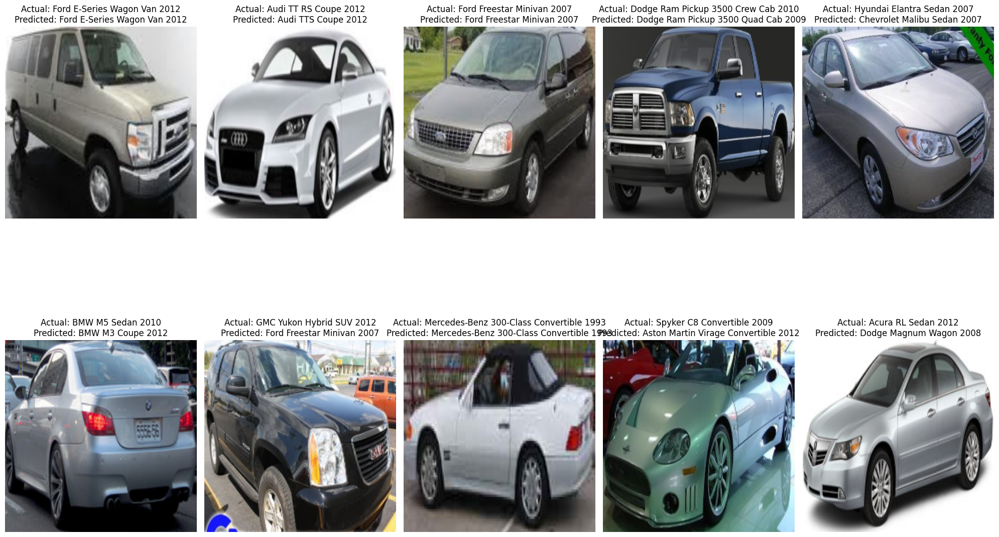

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def plot_images(images, actual_labels, predicted_labels, class_names, num=10):
    plt.figure(figsize=(20, 14))  # Increased figure size for better spacing
    indices = np.random.choice(range(len(images)), num, replace=False)
    for i, index in enumerate(indices):
        ax = plt.subplot(2, 5, i + 1)
        plt.imshow(cv2.cvtColor((images[index] * 255).astype('uint8'), cv2.COLOR_BGR2RGB))
        actual_class_name = class_names[actual_labels[index]]
        predicted_class_name = class_names[predicted_labels[index]]
        plt.title(f"Actual: {actual_class_name}\nPredicted: {predicted_class_name}", fontsize=12)  # Adjust font size
        plt.axis("off")

    plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Adjust spacing between subplots
    plt.tight_layout()
    plt.show()

plot_images(test_images, test_labels, predicted_classes, class_names)


In [ ]:
import matplotlib.pyplot as plt

# Assuming `history` is the result from the model.fit method

# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()
